In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [35]:
df=pd.read_csv("GettingTuitionWaiver.csv")

In [36]:
pd.set_option('display.max_columns', None)
df

,Department,Campus,WaiverCategory,BAE,OccBAE,IncomeSource,AnnualIncome,FamilyMembers,CompletedCredits,SGPA,CGPA,WaiverPercentage
0,Architecture,Dhanmondi,Semester Result,brother,Doing Government Service,government service,300000,5,82,3.23,3.00,30
1,Architecture,Dhanmondi,No Waiver,father,Doing Government Service,government service,150000,4,38,3.22,3.30,0
2,Architecture,Dhanmondi,No Waiver,mother,Retired Person,pension,96000,5,15,3.40,3.25,0
3,Architecture,Dhanmondi,No Waiver,mother,Doing Government Service,government service,300000,5,19,2.94,3.22,0
4,Architecture,Dhanmondi,Semester Result,mother,Doing Government Service,government service,280000,5,70,3.98,3.85,30
...,...,...,...,...,...,...,...,...,...,...,...,...
10812,Tourism & Hospitality Management,Dhanmondi,Siblings Category,father,Doing Job Abroad,remittance,700000,4,24,3.56,3.56,20
10813,Tourism & Hospitality Management,Dhanmondi,No Waiver,father,Doing Job Abroad,remittance,360000,5,67,3.06,2.86,0
10814,Tourism & Hospitality Management,Dhanmondi,No Waiver,father,Doing Business,business,500000,10,78,2.70,2.49,0
10815,Tourism & Hospitality Management,Dhanmondi,No Waiver,father,Doing Private Job,private job service,450000,5,90,3.16,3.02,0


In [37]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10817 entries, 0 to 10816
Data columns (total 12 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Department        10817 non-null  object 
 1   Campus            10817 non-null  object 
 2   WaiverCategory    10817 non-null  object 
 3   BAE               10817 non-null  object 
 4   OccBAE            10817 non-null  object 
 5   IncomeSource      10817 non-null  object 
 6   AnnualIncome      10817 non-null  int64  
 7   FamilyMembers     10817 non-null  int64  
 8   CompletedCredits  10817 non-null  int64  
 9   SGPA              10817 non-null  float64
 10  CGPA              10817 non-null  float64
 11  WaiverPercentage  10817 non-null  int64  
dtypes: float64(2), int64(4), object(6)
memory usage: 1014.2+ KB


In [74]:
df_OHE=df.copy()

In [75]:
objFeatures = df_OHE.select_dtypes(include="object").columns

In [76]:
objFeatures

Index(['Department', 'Campus', 'WaiverCategory', 'BAE', 'OccBAE',
       'IncomeSource'],
      dtype='object')

In [77]:
for col in objFeatures:
    print(col, "  :", len(df_OHE[col].unique())," labels")
    

Department   : 21  labels
Campus   : 3  labels
WaiverCategory   : 17  labels
BAE   : 19  labels
OccBAE   : 9  labels
IncomeSource   : 22  labels


# Most frequent categories for the variable

In [78]:
for col in objFeatures:
    print(col,": \n")
    print(df_OHE[col].value_counts().sort_values(ascending=False).head(22))
    print()

Department : 

Computer Science and Engineering                 4366
Software Engineering                             1107
Business Administration                           930
Electrical and Electronic Engineering             857
Textile Engineering                               675
Civil Engineering                                 626
English                                           549
Pharmacy                                          517
Nutrition and Food Engineering                    324
Law                                               276
Computing and Information System                  121
Multimedia & Creative Technology                  113
Tourism & Hospitality Management                   95
Journalism & Mass Communication                    75
Electronics and Telecommunication Engineering      69
Architecture                                       49
Environmental Science and Disaster Management      39
Business Studies                                   11
Innovation & 

# let's find the top10 most frequent categories for the $Department$

In [79]:
top_10_dept=[x for x in df_OHE.Department.value_counts().sort_values(ascending=False).head(10).index]
top_10_dept

['Computer Science and Engineering',
 'Software Engineering',
 'Business Administration',
 'Electrical and Electronic Engineering',
 'Textile Engineering',
 'Civil Engineering',
 'English',
 'Pharmacy',
 'Nutrition and Food Engineering',
 'Law']

In [80]:
for label in top_10_dept:
    df_OHE['Dept_'+label]= np.where(df_OHE["Department"]==label,1,0)

In [81]:
df_OHE

,Department,Campus,WaiverCategory,BAE,OccBAE,IncomeSource,AnnualIncome,FamilyMembers,CompletedCredits,SGPA,CGPA,WaiverPercentage,Dept_Computer Science and Engineering,Dept_Software Engineering,Dept_Business Administration,Dept_Electrical and Electronic Engineering,Dept_Textile Engineering,Dept_Civil Engineering,Dept_English,Dept_Pharmacy,Dept_Nutrition and Food Engineering,Dept_Law
0,Architecture,Dhanmondi,Semester Result,brother,Doing Government Service,government service,300000,5,82,3.23,3.00,30,0,0,0,0,0,0,0,0,0,0
1,Architecture,Dhanmondi,No Waiver,father,Doing Government Service,government service,150000,4,38,3.22,3.30,0,0,0,0,0,0,0,0,0,0,0
2,Architecture,Dhanmondi,No Waiver,mother,Retired Person,pension,96000,5,15,3.40,3.25,0,0,0,0,0,0,0,0,0,0,0
3,Architecture,Dhanmondi,No Waiver,mother,Doing Government Service,government service,300000,5,19,2.94,3.22,0,0,0,0,0,0,0,0,0,0,0
4,Architecture,Dhanmondi,Semester Result,mother,Doing Government Service,government service,280000,5,70,3.98,3.85,30,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10812,Tourism & Hospitality Management,Dhanmondi,Siblings Category,father,Doing Job Abroad,remittance,700000,4,24,3.56,3.56,20,0,0,0,0,0,0,0,0,0,0
10813,Tourism & Hospitality Management,Dhanmondi,No Waiver,father,Doing Job Abroad,remittance,360000,5,67,3.06,2.86,0,0,0,0,0,0,0,0,0,0,0
10814,Tourism & Hospitality Management,Dhanmondi,No Waiver,father,Doing Business,business,500000,10,78,2.70,2.49,0,0,0,0,0,0,0,0,0,0,0
10815,Tourism & Hospitality Management,Dhanmondi,No Waiver,father,Doing Private Job,private job service,450000,5,90,3.16,3.02,0,0,0,0,0,0,0,0,0,0,0


$Campus$

In [82]:
# create three dummy variables using get_dummies, then exclude the first dummy column
Campus_dummies = pd.get_dummies(df_OHE['Campus'], prefix='Campus').iloc[:,:-1]

In [83]:
# # concatenate the dummy variable columns onto the original DataFrame (axis=0 means rows, axis=1 means columns)
df_OHE = pd.concat([df_OHE, Campus_dummies], axis=1)
df_OHE.head()

,Department,Campus,WaiverCategory,BAE,OccBAE,IncomeSource,AnnualIncome,FamilyMembers,CompletedCredits,SGPA,CGPA,WaiverPercentage,Dept_Computer Science and Engineering,Dept_Software Engineering,Dept_Business Administration,Dept_Electrical and Electronic Engineering,Dept_Textile Engineering,Dept_Civil Engineering,Dept_English,Dept_Pharmacy,Dept_Nutrition and Food Engineering,Dept_Law,Campus_Dhanmondi,Campus_Permanent
0,Architecture,Dhanmondi,Semester Result,brother,Doing Government Service,government service,300000,5,82,3.23,3.00,30,0,0,0,0,0,0,0,0,0,0,1,0
1,Architecture,Dhanmondi,No Waiver,father,Doing Government Service,government service,150000,4,38,3.22,3.30,0,0,0,0,0,0,0,0,0,0,0,1,0
2,Architecture,Dhanmondi,No Waiver,mother,Retired Person,pension,96000,5,15,3.40,3.25,0,0,0,0,0,0,0,0,0,0,0,1,0
3,Architecture,Dhanmondi,No Waiver,mother,Doing Government Service,government service,300000,5,19,2.94,3.22,0,0,0,0,0,0,0,0,0,0,0,1,0
4,Architecture,Dhanmondi,Semester Result,mother,Doing Government Service,government service,280000,5,70,3.98,3.85,30,0,0,0,0,0,0,0,0,0,0,1,0


$WaiverCategory$

In [85]:
top_10_WaiverCategory=[x for x in df_OHE.WaiverCategory.value_counts().sort_values(ascending=False).head(10).index]
for label in top_10_WaiverCategory:
    df_OHE['WaiverCategory_'+label]= np.where(df_OHE["WaiverCategory"]==label,1,0)

In [86]:
df_OHE

,Department,Campus,WaiverCategory,BAE,OccBAE,IncomeSource,AnnualIncome,FamilyMembers,CompletedCredits,SGPA,CGPA,WaiverPercentage,Dept_Computer Science and Engineering,Dept_Software Engineering,Dept_Business Administration,Dept_Electrical and Electronic Engineering,Dept_Textile Engineering,Dept_Civil Engineering,Dept_English,Dept_Pharmacy,Dept_Nutrition and Food Engineering,Dept_Law,Campus_Dhanmondi,Campus_Permanent,WaiverCategory_No Waiver,WaiverCategory_Semester Result,WaiverCategory_Permanent Campus Admission,WaiverCategory_SSC & HSC Result,WaiverCategory_Female Quota,WaiverCategory_HSC Result,WaiverCategory_Freedom Fighter Quota,WaiverCategory_Financial Aid,WaiverCategory_Siblings Category,WaiverCategory_Diu Scholarship Category
0,Architecture,Dhanmondi,Semester Result,brother,Doing Government Service,government service,300000,5,82,3.23,3.00,30,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0
1,Architecture,Dhanmondi,No Waiver,father,Doing Government Service,government service,150000,4,38,3.22,3.30,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0
2,Architecture,Dhanmondi,No Waiver,mother,Retired Person,pension,96000,5,15,3.40,3.25,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0
3,Architecture,Dhanmondi,No Waiver,mother,Doing Government Service,government service,300000,5,19,2.94,3.22,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0
4,Architecture,Dhanmondi,Semester Result,mother,Doing Government Service,government service,280000,5,70,3.98,3.85,30,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10812,Tourism & Hospitality Management,Dhanmondi,Siblings Category,father,Doing Job Abroad,remittance,700000,4,24,3.56,3.56,20,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0
10813,Tourism & Hospitality Management,Dhanmondi,No Waiver,father,Doing Job Abroad,remittance,360000,5,67,3.06,2.86,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0
10814,Tourism & Hospitality Management,Dhanmondi,No Waiver,father,Doing Business,business,500000,10,78,2.70,2.49,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0
10815,Tourism & Hospitality Management,Dhanmondi,No Waiver,father,Doing Private Job,private job service,450000,5,90,3.16,3.02,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0


$BAE$

In [87]:
top_10_BAE=[x for x in df_OHE.BAE.value_counts().sort_values(ascending=False).head(10).index]
for label in top_10_BAE:
    df_OHE['BAE_'+label]= np.where(df_OHE["BAE"]==label,1,0)

In [88]:
df_OHE

,Department,Campus,WaiverCategory,BAE,OccBAE,IncomeSource,AnnualIncome,FamilyMembers,CompletedCredits,SGPA,CGPA,WaiverPercentage,Dept_Computer Science and Engineering,Dept_Software Engineering,Dept_Business Administration,Dept_Electrical and Electronic Engineering,Dept_Textile Engineering,Dept_Civil Engineering,Dept_English,Dept_Pharmacy,Dept_Nutrition and Food Engineering,Dept_Law,Campus_Dhanmondi,Campus_Permanent,WaiverCategory_No Waiver,WaiverCategory_Semester Result,WaiverCategory_Permanent Campus Admission,WaiverCategory_SSC & HSC Result,WaiverCategory_Female Quota,WaiverCategory_HSC Result,WaiverCategory_Freedom Fighter Quota,WaiverCategory_Financial Aid,WaiverCategory_Siblings Category,WaiverCategory_Diu Scholarship Category,BAE_father,BAE_mother,BAE_brother,BAE_parents,BAE_uncle,BAE_sister,BAE_myself,BAE_husband,BAE_grandfather,BAE_father and uncle
0,Architecture,Dhanmondi,Semester Result,brother,Doing Government Service,government service,300000,5,82,3.23,3.00,30,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
1,Architecture,Dhanmondi,No Waiver,father,Doing Government Service,government service,150000,4,38,3.22,3.30,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
2,Architecture,Dhanmondi,No Waiver,mother,Retired Person,pension,96000,5,15,3.40,3.25,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
3,Architecture,Dhanmondi,No Waiver,mother,Doing Government Service,government service,300000,5,19,2.94,3.22,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
4,Architecture,Dhanmondi,Semester Result,mother,Doing Government Service,government service,280000,5,70,3.98,3.85,30,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10812,Tourism & Hospitality Management,Dhanmondi,Siblings Category,father,Doing Job Abroad,remittance,700000,4,24,3.56,3.56,20,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0
10813,Tourism & Hospitality Management,Dhanmondi,No Waiver,father,Doing Job Abroad,remittance,360000,5,67,3.06,2.86,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
10814,Tourism & Hospitality Management,Dhanmondi,No Waiver,father,Doing Business,business,500000,10,78,2.70,2.49,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
10815,Tourism & Hospitality Management,Dhanmondi,No Waiver,father,Doing Private Job,private job service,450000,5,90,3.16,3.02,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0


$OccBAE$

In [89]:
# create three dummy variables using get_dummies, then exclude the first dummy column
OccBAE_dummies = pd.get_dummies(df_OHE['OccBAE'], prefix='OccBAE').iloc[:,:-1]

In [90]:
# # concatenate the dummy variable columns onto the original DataFrame (axis=0 means rows, axis=1 means columns)
df_OHE = pd.concat([df_OHE, OccBAE_dummies], axis=1)
df_OHE.head()

,Department,Campus,WaiverCategory,BAE,OccBAE,IncomeSource,AnnualIncome,FamilyMembers,CompletedCredits,SGPA,CGPA,WaiverPercentage,Dept_Computer Science and Engineering,Dept_Software Engineering,Dept_Business Administration,Dept_Electrical and Electronic Engineering,Dept_Textile Engineering,Dept_Civil Engineering,Dept_English,Dept_Pharmacy,Dept_Nutrition and Food Engineering,Dept_Law,Campus_Dhanmondi,Campus_Permanent,WaiverCategory_No Waiver,WaiverCategory_Semester Result,WaiverCategory_Permanent Campus Admission,WaiverCategory_SSC & HSC Result,WaiverCategory_Female Quota,WaiverCategory_HSC Result,WaiverCategory_Freedom Fighter Quota,WaiverCategory_Financial Aid,WaiverCategory_Siblings Category,WaiverCategory_Diu Scholarship Category,BAE_father,BAE_mother,BAE_brother,BAE_parents,BAE_uncle,BAE_sister,BAE_myself,BAE_husband,BAE_grandfather,BAE_father and uncle,OccBAE_Banker,OccBAE_Doctor,OccBAE_Doing Business,OccBAE_Doing Government Service,OccBAE_Doing Job Abroad,OccBAE_Doing Private Job,OccBAE_Farmer (Agriculture),OccBAE_Retired Person
0,Architecture,Dhanmondi,Semester Result,brother,Doing Government Service,government service,300000,5,82,3.23,3.00,30,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
1,Architecture,Dhanmondi,No Waiver,father,Doing Government Service,government service,150000,4,38,3.22,3.30,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
2,Architecture,Dhanmondi,No Waiver,mother,Retired Person,pension,96000,5,15,3.40,3.25,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
3,Architecture,Dhanmondi,No Waiver,mother,Doing Government Service,government service,300000,5,19,2.94,3.22,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
4,Architecture,Dhanmondi,Semester Result,mother,Doing Government Service,government service,280000,5,70,3.98,3.85,30,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0


$IncomeSource$

In [91]:
top_10_IncomeSource=[x for x in df_OHE.IncomeSource.value_counts().sort_values(ascending=False).head(10).index]
for label in top_10_IncomeSource:
    df_OHE['IncomeSource_'+label]= np.where(df_OHE["IncomeSource"]==label,1,0)

In [92]:
df_OHE

,Department,Campus,WaiverCategory,BAE,OccBAE,IncomeSource,AnnualIncome,FamilyMembers,CompletedCredits,SGPA,CGPA,WaiverPercentage,Dept_Computer Science and Engineering,Dept_Software Engineering,Dept_Business Administration,Dept_Electrical and Electronic Engineering,Dept_Textile Engineering,Dept_Civil Engineering,Dept_English,Dept_Pharmacy,Dept_Nutrition and Food Engineering,Dept_Law,Campus_Dhanmondi,Campus_Permanent,WaiverCategory_No Waiver,WaiverCategory_Semester Result,WaiverCategory_Permanent Campus Admission,WaiverCategory_SSC & HSC Result,WaiverCategory_Female Quota,WaiverCategory_HSC Result,WaiverCategory_Freedom Fighter Quota,WaiverCategory_Financial Aid,WaiverCategory_Siblings Category,WaiverCategory_Diu Scholarship Category,BAE_father,BAE_mother,BAE_brother,BAE_parents,BAE_uncle,BAE_sister,BAE_myself,BAE_husband,BAE_grandfather,BAE_father and uncle,OccBAE_Banker,OccBAE_Doctor,OccBAE_Doing Business,OccBAE_Doing Government Service,OccBAE_Doing Job Abroad,OccBAE_Doing Private Job,OccBAE_Farmer (Agriculture),OccBAE_Retired Person,IncomeSource_business,IncomeSource_private job service,IncomeSource_cultivation and farming,IncomeSource_government service,IncomeSource_teaching,IncomeSource_remittance,IncomeSource_pension,IncomeSource_house rent,IncomeSource_shop business,IncomeSource_banking service
0,Architecture,Dhanmondi,Semester Result,brother,Doing Government Service,government service,300000,5,82,3.23,3.00,30,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0
1,Architecture,Dhanmondi,No Waiver,father,Doing Government Service,government service,150000,4,38,3.22,3.30,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0
2,Architecture,Dhanmondi,No Waiver,mother,Retired Person,pension,96000,5,15,3.40,3.25,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0
3,Architecture,Dhanmondi,No Waiver,mother,Doing Government Service,government service,300000,5,19,2.94,3.22,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0
4,Architecture,Dhanmondi,Semester Result,mother,Doing Government Service,government service,280000,5,70,3.98,3.85,30,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10812,Tourism & Hospitality Management,Dhanmondi,Siblings Category,father,Doing Job Abroad,remittance,700000,4,24,3.56,3.56,20,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0
10813,Tourism & Hospitality Management,Dhanmondi,No Waiver,father,Doing Job Abroad,remittance,360000,5,67,3.06,2.86,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0
10814,Tourism & Hospitality Management,Dhanmondi,No Waiver,father,Doing Business,business,500000,10,78,2.70,2.49,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
10815,Tourism & Hospitality Management,Dhanmondi,No Waiver,father,Doing Private Job,private job service,450000,5,90,3.16,3.02,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0


In [93]:
df_OHE1 = df_OHE.drop(["Department","Campus","WaiverCategory","BAE","OccBAE","IncomeSource"],axis='columns')
df_OHE1

,AnnualIncome,FamilyMembers,CompletedCredits,SGPA,CGPA,WaiverPercentage,Dept_Computer Science and Engineering,Dept_Software Engineering,Dept_Business Administration,Dept_Electrical and Electronic Engineering,Dept_Textile Engineering,Dept_Civil Engineering,Dept_English,Dept_Pharmacy,Dept_Nutrition and Food Engineering,Dept_Law,Campus_Dhanmondi,Campus_Permanent,WaiverCategory_No Waiver,WaiverCategory_Semester Result,WaiverCategory_Permanent Campus Admission,WaiverCategory_SSC & HSC Result,WaiverCategory_Female Quota,WaiverCategory_HSC Result,WaiverCategory_Freedom Fighter Quota,WaiverCategory_Financial Aid,WaiverCategory_Siblings Category,WaiverCategory_Diu Scholarship Category,BAE_father,BAE_mother,BAE_brother,BAE_parents,BAE_uncle,BAE_sister,BAE_myself,BAE_husband,BAE_grandfather,BAE_father and uncle,OccBAE_Banker,OccBAE_Doctor,OccBAE_Doing Business,OccBAE_Doing Government Service,OccBAE_Doing Job Abroad,OccBAE_Doing Private Job,OccBAE_Farmer (Agriculture),OccBAE_Retired Person,IncomeSource_business,IncomeSource_private job service,IncomeSource_cultivation and farming,IncomeSource_government service,IncomeSource_teaching,IncomeSource_remittance,IncomeSource_pension,IncomeSource_house rent,IncomeSource_shop business,IncomeSource_banking service
0,300000,5,82,3.23,3.00,30,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0
1,150000,4,38,3.22,3.30,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0
2,96000,5,15,3.40,3.25,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0
3,300000,5,19,2.94,3.22,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0
4,280000,5,70,3.98,3.85,30,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10812,700000,4,24,3.56,3.56,20,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0
10813,360000,5,67,3.06,2.86,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0
10814,500000,10,78,2.70,2.49,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
10815,450000,5,90,3.16,3.02,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0


In [95]:
df_OHE2=df_OHE1[["AnnualIncome","FamilyMembers","CompletedCredits","SGPA","CGPA","WaiverPercentage"]]
df_OHE3 = df_OHE1.drop(["AnnualIncome","FamilyMembers","CompletedCredits","SGPA","CGPA","WaiverPercentage"],axis='columns')
df_OHE3

,Dept_Computer Science and Engineering,Dept_Software Engineering,Dept_Business Administration,Dept_Electrical and Electronic Engineering,Dept_Textile Engineering,Dept_Civil Engineering,Dept_English,Dept_Pharmacy,Dept_Nutrition and Food Engineering,Dept_Law,Campus_Dhanmondi,Campus_Permanent,WaiverCategory_No Waiver,WaiverCategory_Semester Result,WaiverCategory_Permanent Campus Admission,WaiverCategory_SSC & HSC Result,WaiverCategory_Female Quota,WaiverCategory_HSC Result,WaiverCategory_Freedom Fighter Quota,WaiverCategory_Financial Aid,WaiverCategory_Siblings Category,WaiverCategory_Diu Scholarship Category,BAE_father,BAE_mother,BAE_brother,BAE_parents,BAE_uncle,BAE_sister,BAE_myself,BAE_husband,BAE_grandfather,BAE_father and uncle,OccBAE_Banker,OccBAE_Doctor,OccBAE_Doing Business,OccBAE_Doing Government Service,OccBAE_Doing Job Abroad,OccBAE_Doing Private Job,OccBAE_Farmer (Agriculture),OccBAE_Retired Person,IncomeSource_business,IncomeSource_private job service,IncomeSource_cultivation and farming,IncomeSource_government service,IncomeSource_teaching,IncomeSource_remittance,IncomeSource_pension,IncomeSource_house rent,IncomeSource_shop business,IncomeSource_banking service
0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0
3,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10812,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0
10813,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0
10814,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
10815,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0


In [97]:
df_OHE4 = pd.concat([df_OHE3, df_OHE2], axis=1)
df_OHE4

,Dept_Computer Science and Engineering,Dept_Software Engineering,Dept_Business Administration,Dept_Electrical and Electronic Engineering,Dept_Textile Engineering,Dept_Civil Engineering,Dept_English,Dept_Pharmacy,Dept_Nutrition and Food Engineering,Dept_Law,Campus_Dhanmondi,Campus_Permanent,WaiverCategory_No Waiver,WaiverCategory_Semester Result,WaiverCategory_Permanent Campus Admission,WaiverCategory_SSC & HSC Result,WaiverCategory_Female Quota,WaiverCategory_HSC Result,WaiverCategory_Freedom Fighter Quota,WaiverCategory_Financial Aid,WaiverCategory_Siblings Category,WaiverCategory_Diu Scholarship Category,BAE_father,BAE_mother,BAE_brother,BAE_parents,BAE_uncle,BAE_sister,BAE_myself,BAE_husband,BAE_grandfather,BAE_father and uncle,OccBAE_Banker,OccBAE_Doctor,OccBAE_Doing Business,OccBAE_Doing Government Service,OccBAE_Doing Job Abroad,OccBAE_Doing Private Job,OccBAE_Farmer (Agriculture),OccBAE_Retired Person,IncomeSource_business,IncomeSource_private job service,IncomeSource_cultivation and farming,IncomeSource_government service,IncomeSource_teaching,IncomeSource_remittance,IncomeSource_pension,IncomeSource_house rent,IncomeSource_shop business,IncomeSource_banking service,AnnualIncome,FamilyMembers,CompletedCredits,SGPA,CGPA,WaiverPercentage
0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,300000,5,82,3.23,3.00,30
1,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,150000,4,38,3.22,3.30,0
2,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,96000,5,15,3.40,3.25,0
3,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,300000,5,19,2.94,3.22,0
4,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,280000,5,70,3.98,3.85,30
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10812,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,700000,4,24,3.56,3.56,20
10813,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,360000,5,67,3.06,2.86,0
10814,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,500000,10,78,2.70,2.49,0
10815,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,450000,5,90,3.16,3.02,0


In [98]:
df_OHE4.to_csv("GettingTuitionWaiver_OHE.csv",index=False)

In [100]:
df_OHE4.describe().T

,count,mean,std,min,25%,50%,75%,max
Dept_Computer Science and Engineering,10817.0,0.403624,0.490646,0.0,0.00,0.00,1.00,1.0
Dept_Software Engineering,10817.0,0.102339,0.303107,0.0,0.00,0.00,0.00,1.0
Dept_Business Administration,10817.0,0.085976,0.280341,0.0,0.00,0.00,0.00,1.0
Dept_Electrical and Electronic Engineering,10817.0,0.079227,0.270105,0.0,0.00,0.00,0.00,1.0
Dept_Textile Engineering,10817.0,0.062402,0.241895,0.0,0.00,0.00,0.00,1.0
Dept_Civil Engineering,10817.0,0.057872,0.233512,0.0,0.00,0.00,0.00,1.0
Dept_English,10817.0,0.050753,0.219504,0.0,0.00,0.00,0.00,1.0
Dept_Pharmacy,10817.0,0.047795,0.213342,0.0,0.00,0.00,0.00,1.0
Dept_Nutrition and Food Engineering,10817.0,0.029953,0.170465,0.0,0.00,0.00,0.00,1.0
Dept_Law,10817.0,0.025515,0.157692,0.0,0.00,0.00,0.00,1.0


In [101]:
df_OHE4.corr()

,Dept_Computer Science and Engineering,Dept_Software Engineering,Dept_Business Administration,Dept_Electrical and Electronic Engineering,Dept_Textile Engineering,Dept_Civil Engineering,Dept_English,Dept_Pharmacy,Dept_Nutrition and Food Engineering,Dept_Law,Campus_Dhanmondi,Campus_Permanent,WaiverCategory_No Waiver,WaiverCategory_Semester Result,WaiverCategory_Permanent Campus Admission,WaiverCategory_SSC & HSC Result,WaiverCategory_Female Quota,WaiverCategory_HSC Result,WaiverCategory_Freedom Fighter Quota,WaiverCategory_Financial Aid,WaiverCategory_Siblings Category,WaiverCategory_Diu Scholarship Category,BAE_father,BAE_mother,BAE_brother,BAE_parents,BAE_uncle,BAE_sister,BAE_myself,BAE_husband,BAE_grandfather,BAE_father and uncle,OccBAE_Banker,OccBAE_Doctor,OccBAE_Doing Business,OccBAE_Doing Government Service,OccBAE_Doing Job Abroad,OccBAE_Doing Private Job,OccBAE_Farmer (Agriculture),OccBAE_Retired Person,IncomeSource_business,IncomeSource_private job service,IncomeSource_cultivation and farming,IncomeSource_government service,IncomeSource_teaching,IncomeSource_remittance,IncomeSource_pension,IncomeSource_house rent,IncomeSource_shop business,IncomeSource_banking service,AnnualIncome,FamilyMembers,CompletedCredits,SGPA,CGPA,WaiverPercentage
Dept_Computer Science and Engineering,1.000000,-0.277775,-0.252312,-0.241318,-0.212236,-0.203895,-0.190227,-0.184313,-0.144561,-0.133120,-0.033111,0.024478,-0.103165,-0.006627,0.010198,0.100938,0.003133,0.081037,0.000085,0.021344,0.008295,0.040012,0.016191,0.003666,-0.023429,0.004931,-0.003512,-0.011379,-0.014721,-0.026048,-0.005849,0.007072,0.033123,0.038629,-0.033463,0.035559,-0.018701,-0.011065,-0.032250,0.015452,-0.022475,-0.009980,-0.029695,0.036802,0.042210,-0.017073,0.010567,-0.026867,-0.006597,0.034600,-0.005184,-0.028179,0.045712,0.084247,0.048073,0.094788
Dept_Software Engineering,-0.277775,1.000000,-0.103556,-0.099043,-0.087107,-0.083684,-0.078074,-0.075647,-0.059332,-0.054636,0.077800,-0.069158,0.048402,-0.040889,-0.022579,0.012053,-0.013767,-0.012444,-0.013957,0.029231,0.005276,-0.018714,0.000849,-0.003508,0.015130,0.003765,-0.009186,-0.008084,-0.017806,-0.004665,0.001182,-0.012155,-0.022484,-0.008775,0.004233,0.003408,0.030241,0.002097,-0.039230,-0.004710,-0.006478,0.000422,-0.043654,0.003237,0.015483,0.029825,-0.008299,0.009063,0.030980,-0.017426,0.039871,-0.030135,0.020556,-0.111492,-0.055682,-0.033351
Dept_Business Administration,-0.252312,-0.103556,1.000000,-0.089964,-0.079122,-0.076013,-0.070917,-0.068713,-0.053893,-0.049628,-0.045836,0.025778,0.003486,0.020834,0.019343,-0.046693,-0.003397,-0.026026,0.030549,-0.010153,0.007943,-0.015164,0.014274,-0.006290,-0.022504,-0.003804,-0.007924,0.022639,-0.016174,0.024312,0.011752,0.007305,0.014239,-0.020476,0.103462,-0.023823,-0.006785,-0.023619,-0.058419,-0.003267,0.101964,-0.022546,-0.063564,-0.024487,-0.046114,-0.005071,-0.009240,0.043148,-0.013563,0.008838,0.033197,-0.012919,-0.085413,-0.030159,-0.034418,-0.023738
Dept_Electrical and Electronic Engineering,-0.241318,-0.099043,-0.089964,1.000000,-0.075675,-0.072701,-0.067827,-0.065718,-0.051545,-0.047465,-0.110857,0.119635,0.006671,0.053035,0.017132,-0.043801,-0.055865,-0.028650,0.023083,-0.007615,-0.028478,-0.013568,-0.018689,-0.015537,0.028689,-0.003374,0.012387,0.006584,0.062632,0.005905,-0.011976,-0.001039,-0.016479,-0.004135,-0.053552,-0.020444,-0.006879,0.028328,0.126822,-0.019797,-0.057506,0.027517,0.125489,-0.022106,-0.021365,-0.007571,-0.004285,-0.025724,0.010729,-0.019613,-0.040515,0.035523,0.064164,0.016717,0.028797,-0.015772
Dept_Textile Engineering,-0.212236,-0.087107,-0.079122,-0.075675,1.000000,-0.063939,-0.059653,-0.057799,-0.045333,-0.041745,0.036687,-0.029922,0.048284,-0.009390,0.006625,-0.035951,-0.039657,-0.017482,-0.005753,-0.003679,0.002771,-0.017975,-0.005122,0.010130,-0.003287,0.002294,0.012264,-0.013708,-0.006338,-0.012905,0.008221,0.001343,-0.003734,-0.005723,-0.033488,-0.009711,-0.009521,0.000161,0.057094,-0.000297,-0.029304,-0.002164,0.060757,-0.0

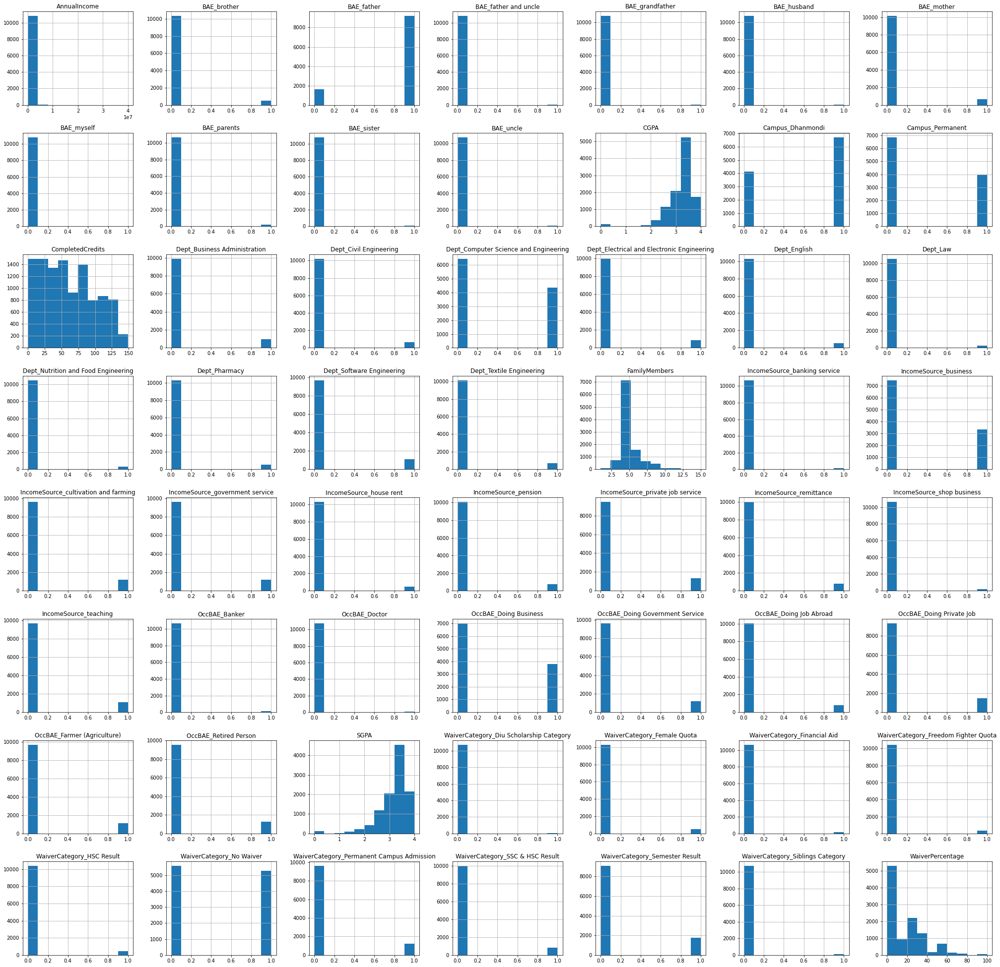

In [107]:
# for data distributions
df_OHE4.hist(figsize= (35,35))
plt.show()

Text(0, 0.5, 'Y axis')

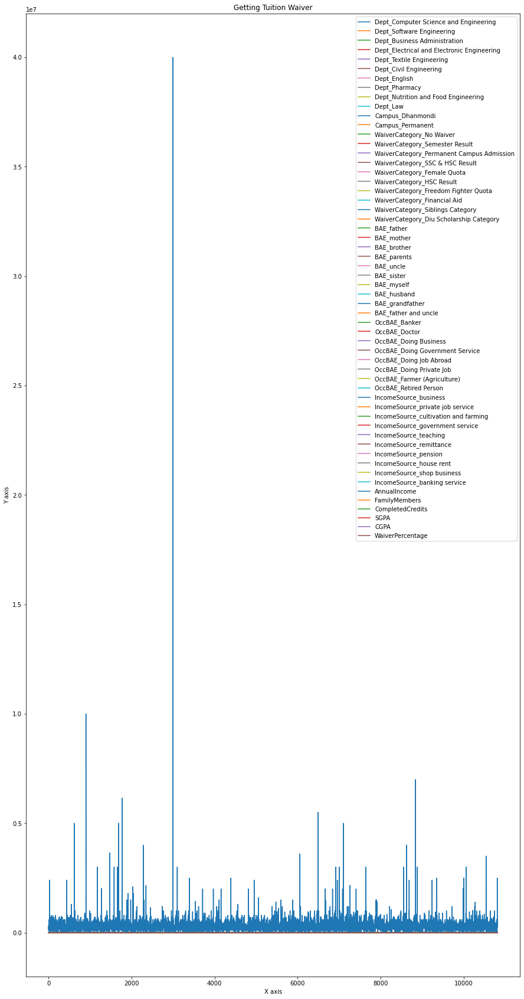

In [108]:
a=df_OHE4.plot(figsize=(15,30), title="Getting Tuition Waiver")
a.set_xlabel("X axis")
a.set_ylabel("Y axis")

Text(0, 0.5, 'Y axis')

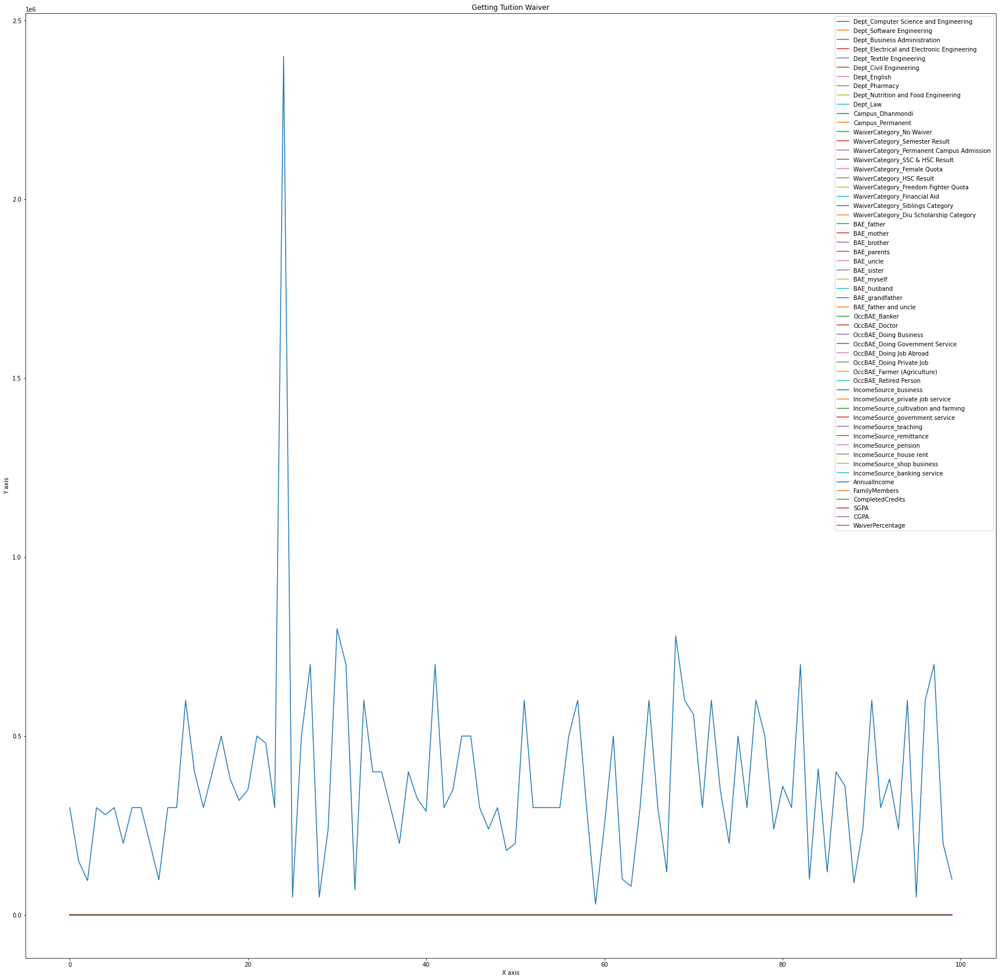

In [112]:
a=df_OHE4.head(100).plot(figsize=(30,30), title="Getting Tuition Waiver")
a.set_xlabel("X axis")
a.set_ylabel("Y axis")

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x000001C08E193EB0>,
        ...,
        ...,
        ...,
       ...,
        ...,
        ...,
        ...,
      dtype=object)

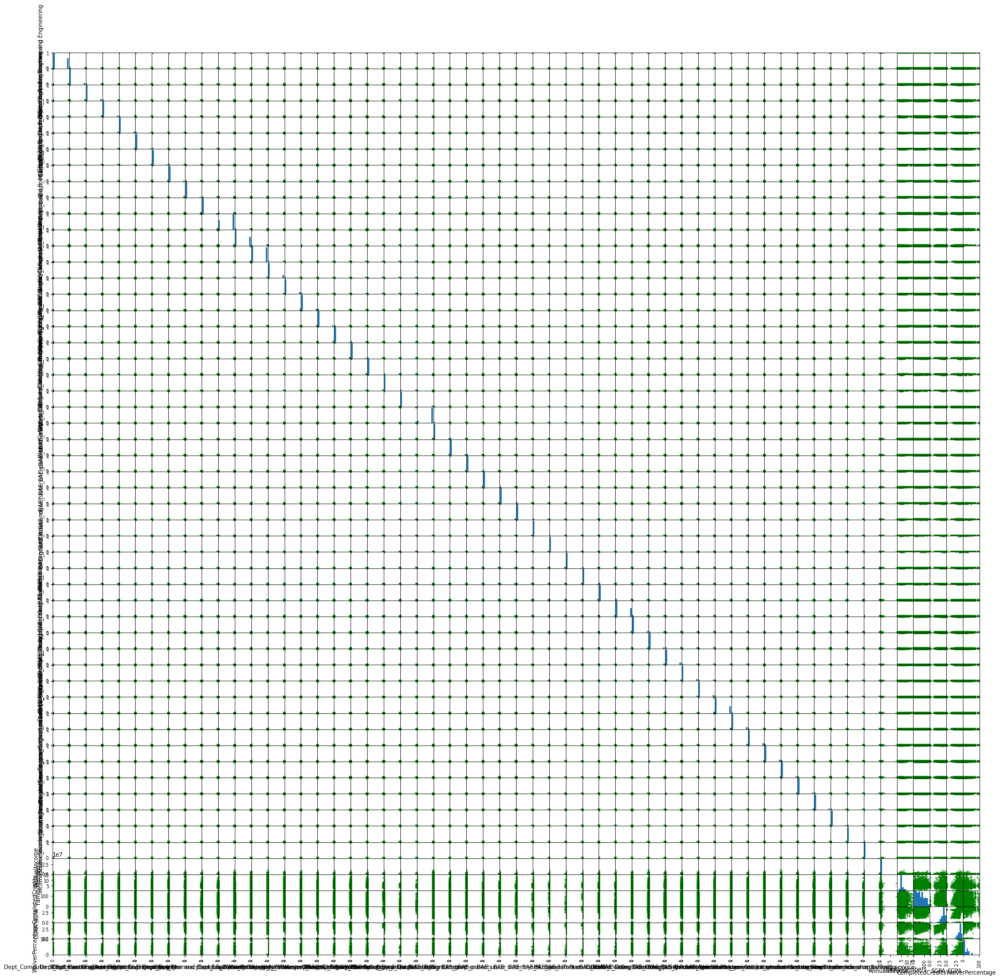

In [117]:
pd.plotting.scatter_matrix(df_OHE4,color='green',figsize=(30,30))

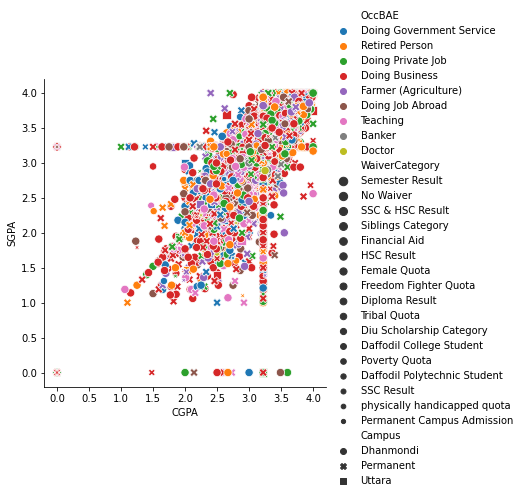

In [121]:
sns.relplot(x='CGPA', y='SGPA', data=df, hue='OccBAE', size='WaiverCategory',style='Campus',).figsize=(30,30)

In [126]:
df

,Department,Campus,WaiverCategory,BAE,OccBAE,IncomeSource,AnnualIncome,FamilyMembers,CompletedCredits,SGPA,CGPA,WaiverPercentage
0,Architecture,Dhanmondi,Semester Result,brother,Doing Government Service,government service,300000,5,82,3.23,3.00,30
1,Architecture,Dhanmondi,No Waiver,father,Doing Government Service,government service,150000,4,38,3.22,3.30,0
2,Architecture,Dhanmondi,No Waiver,mother,Retired Person,pension,96000,5,15,3.40,3.25,0
3,Architecture,Dhanmondi,No Waiver,mother,Doing Government Service,government service,300000,5,19,2.94,3.22,0
4,Architecture,Dhanmondi,Semester Result,mother,Doing Government Service,government service,280000,5,70,3.98,3.85,30
...,...,...,...,...,...,...,...,...,...,...,...,...
10812,Tourism & Hospitality Management,Dhanmondi,Siblings Category,father,Doing Job Abroad,remittance,700000,4,24,3.56,3.56,20
10813,Tourism & Hospitality Management,Dhanmondi,No Waiver,father,Doing Job Abroad,remittance,360000,5,67,3.06,2.86,0
10814,Tourism & Hospitality Management,Dhanmondi,No Waiver,father,Doing Business,business,500000,10,78,2.70,2.49,0
10815,Tourism & Hospitality Management,Dhanmondi,No Waiver,father,Doing Private Job,private job service,450000,5,90,3.16,3.02,0


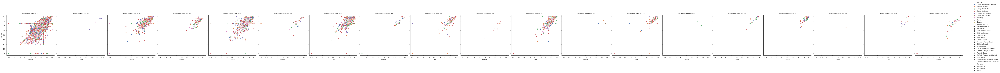

In [151]:
sns.relplot(x='CGPA', y='SGPA', data=df, hue='OccBAE', size='WaiverCategory',style='Campus',col='WaiverPercentage')

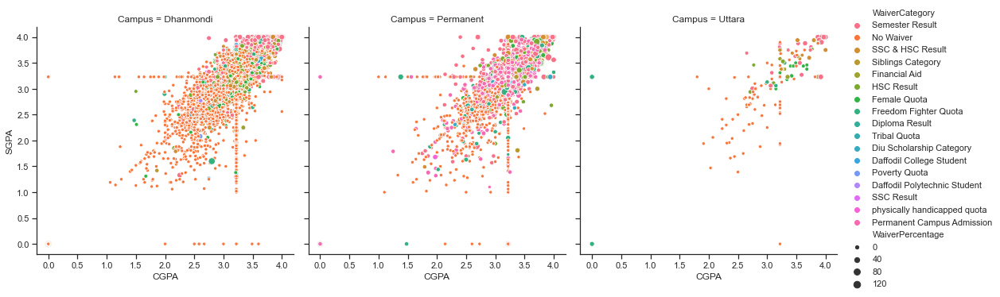

In [153]:
# sns.set_style('ticks')
# fig, ax = plt.subplots()
# fig.set_size_inches(18.5, 10.5)
sns.relplot(x='CGPA', y='SGPA',ax=ax, data=df, hue='WaiverCategory', size='WaiverPercentage',col='Campus',)
#sns.regplot(data[:,0], data[:,1], ax=ax)
#sns.despine()

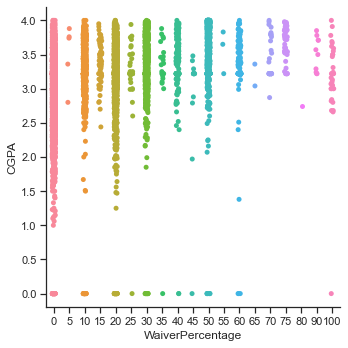

In [158]:
sns.catplot(x='WaiverPercentage', y='CGPA',data=df) # catagoricaly data show

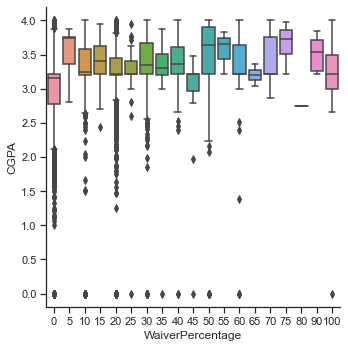

In [160]:
sns.catplot(x='WaiverPercentage', y='CGPA', data=df_OHE4, kind='box')

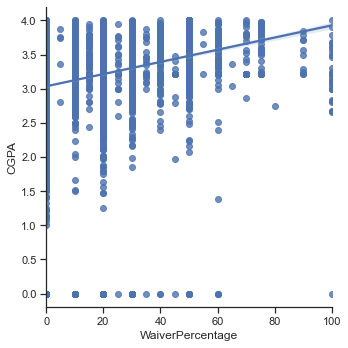

In [165]:
sns.lmplot(x='WaiverPercentage',y='CGPA',data=df_OHE4)# It shows a line on a 2 dimensional plane

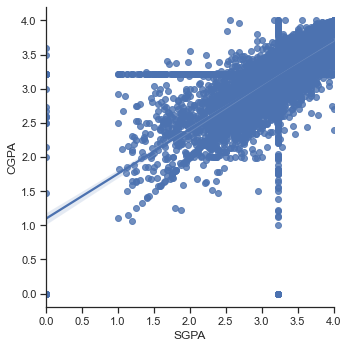

In [166]:
sns.lmplot(x='SGPA',y='CGPA',data=df_OHE4)

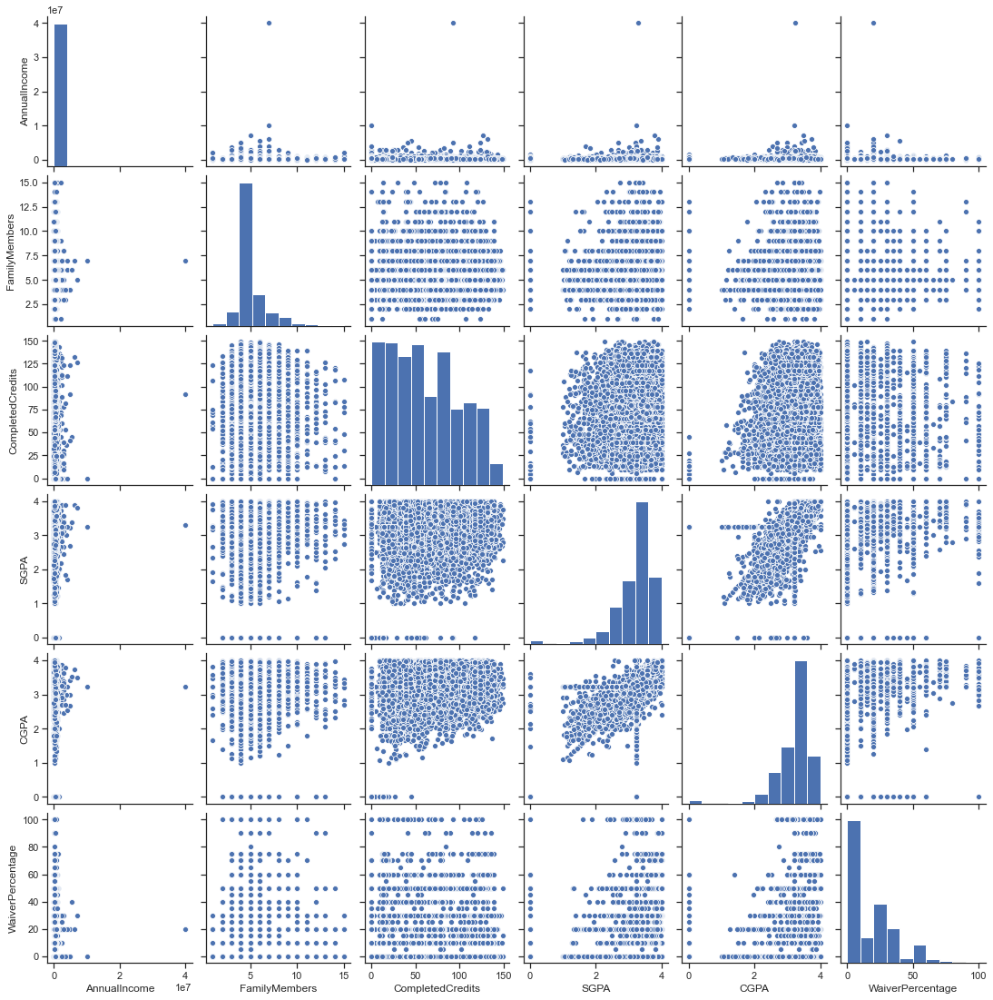

In [167]:
sns.pairplot(df)

In [198]:
def target(dataframe, target):
    f, ax = plt.subplots(1, 2, figsize=(40,20))
    dataframe[target].value_counts().plot.pie(explode=None, autopct='%1.2f%%', ax=ax[0], shadow=True)
    ax[0].set_title(target + ' Distribution')
    ax[0].set_ylabel('')
    sns.countplot(target, data=dataframe, ax=ax[1])
    ax[1].set_title(target + " Count Plot")
    plt.show()

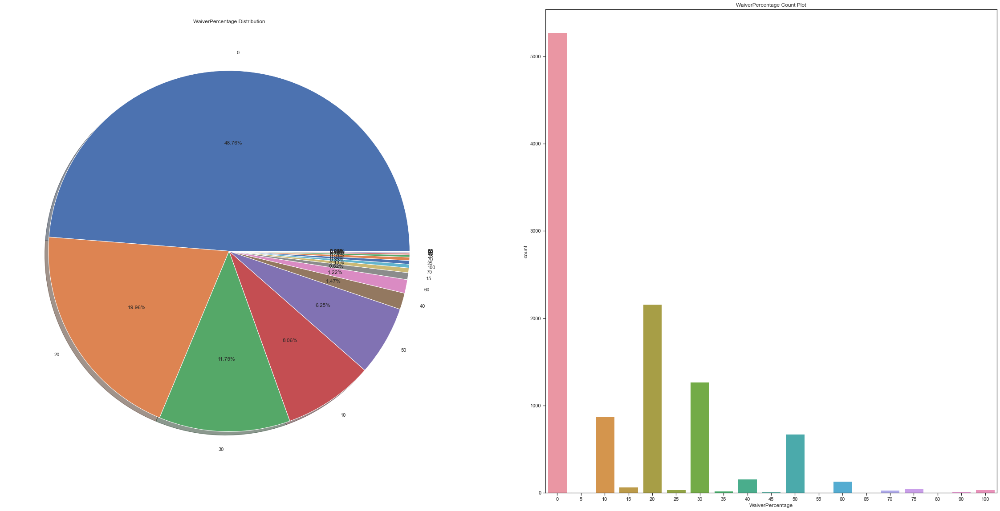

In [199]:
target(df, "WaiverPercentage")

In [ ]:
#df_OHE4.drop(['WaiverPercentage'],axis=1).plot.pie(subplots=True, figsize=(20,20), fontsize=20, autopct="%.2f")

In [2]:
df_=pd.read_csv("GettingTuitionWaiver_OHE.csv")

In [3]:
pd.set_option('display.max_columns', None)

In [5]:
df_

,Dept_Computer Science and Engineering,Dept_Software Engineering,Dept_Business Administration,Dept_Electrical and Electronic Engineering,Dept_Textile Engineering,Dept_Civil Engineering,Dept_English,Dept_Pharmacy,Dept_Nutrition and Food Engineering,Dept_Law,Campus_Dhanmondi,Campus_Permanent,WaiverCategory_No Waiver,WaiverCategory_Semester Result,WaiverCategory_Permanent Campus Admission,WaiverCategory_SSC & HSC Result,WaiverCategory_Female Quota,WaiverCategory_HSC Result,WaiverCategory_Freedom Fighter Quota,WaiverCategory_Financial Aid,WaiverCategory_Siblings Category,WaiverCategory_Diu Scholarship Category,BAE_father,BAE_mother,BAE_brother,BAE_parents,BAE_uncle,BAE_sister,BAE_myself,BAE_husband,BAE_grandfather,BAE_father and uncle,OccBAE_Banker,OccBAE_Doctor,OccBAE_Doing Business,OccBAE_Doing Government Service,OccBAE_Doing Job Abroad,OccBAE_Doing Private Job,OccBAE_Farmer (Agriculture),OccBAE_Retired Person,IncomeSource_business,IncomeSource_private job service,IncomeSource_cultivation and farming,IncomeSource_government service,IncomeSource_teaching,IncomeSource_remittance,IncomeSource_pension,IncomeSource_house rent,IncomeSource_shop business,IncomeSource_banking service,AnnualIncome,FamilyMembers,CompletedCredits,SGPA,CGPA,WaiverPercentage
0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,300000,5,82,3.23,3.00,30
1,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,150000,4,38,3.22,3.30,0
2,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,96000,5,15,3.40,3.25,0
3,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,300000,5,19,2.94,3.22,0
4,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,280000,5,70,3.98,3.85,30
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10812,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,700000,4,24,3.56,3.56,20
10813,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,360000,5,67,3.06,2.86,0
10814,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,500000,10,78,2.70,2.49,0
10815,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,450000,5,90,3.16,3.02,0


In [6]:
from pandas_profiling import ProfileReport

In [7]:
profile= ProfileReport(df_,title="HR-Employee-Attrition", html={'style':{'full_width':True}})

In [8]:
profile

Summarize dataset:   0%|          | 0/69 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [9]:
import dtale

In [10]:
dtale.show(df_)

# $Train$ and $Test$ spliting

In [4]:
from sklearn.model_selection import train_test_split 
from sklearn.preprocessing import StandardScaler

In [5]:
# X=df_.iloc[:,:-1].values
# y=df_.iloc[:,-1].values

In [6]:
X = df_.drop(columns = 'WaiverPercentage')
y = df_['WaiverPercentage']

In [7]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.1, random_state =1125)

# Decision Tree Regression

In [8]:
from sklearn.metrics import confusion_matrix,plot_confusion_matrix 
from sklearn import tree
from sklearn.metrics import accuracy_score,f1_score, precision_score, recall_score 
from sklearn.metrics import classification_report
from sklearn.tree import DecisionTreeRegressor

In [9]:
DT=DecisionTreeRegressor(criterion='mse',splitter='random',max_depth=11,random_state=125,min_samples_split=12,
    min_samples_leaf=11,)

In [10]:
DT.fit(X_train,y_train)

DecisionTreeRegressor(max_depth=11, min_samples_leaf=11, min_samples_split=12,
                      random_state=125, splitter='random')

In [11]:
DT_y_pred=DT.predict(X_test)
print("Actual value:  Predicted value:")
print(list(y_test[0:30]))
print(DT_y_pred[0:30])

Actual value:  Predicted value:
[0, 0, 0, 0, 30, 0, 0, 20, 0, 20, 0, 20, 25, 15, 20, 0, 30, 10, 0, 20, 0, 10, 0, 0, 0, 0, 10, 0, 0, 0]
[ 0.          0.          0.          0.         26.05172414  0.
  0.         23.51270553  0.         25.34055728  0.         23.51270553
 28.57142857 16.25       27.08841463  0.         30.90909091 30.66666667
  0.         23.51270553  0.         10.          0.          0.
  0.          0.         25.34055728  0.          0.          0.        ]


In [12]:
DT_trainScore=DT.score(X_train,y_train)
DT_trainScore

0.7230939915224424

In [13]:
from sklearn.metrics import r2_score
r2_score(y_test, DT_y_pred)

0.7448808416743092

In [14]:
from sklearn.metrics import mean_absolute_error,mean_squared_error

DT_MAE=mean_absolute_error(y_test, DT_y_pred)
print("Mean Absolute Error:", DT_MAE)

DT_MSE=mean_squared_error(y_test, DT_y_pred)
print("Mean Square Error:", DT_MSE)

#the root mean squared error
DT_rmse = mean_squared_error(y_test, DT_y_pred, squared = False)
print("Root Mean Square Error:", DT_rmse)

Mean Absolute Error: 4.041873497447998
Mean Square Error: 68.00694042578702
Root Mean Square Error: 8.24663206562455


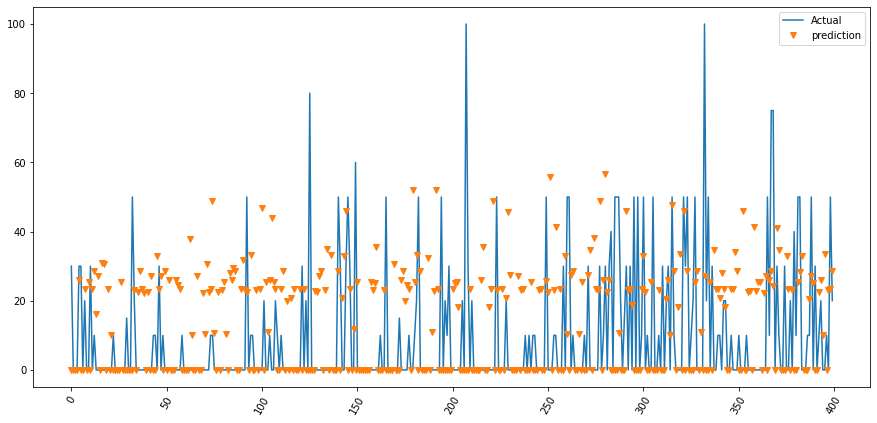

In [15]:
#plt.rcParams['figure.dpi'] = 150
plt.rcParams['figure.figsize'] = (15,7)
plt.plot(y[0:400],label = 'Actual')
plt.plot(DT_y_pred[0:400],'v',label = 'prediction')
plt.xticks(rotation = '60'); 
plt.legend()
plt.show()

# Cross validation for DT_regression

In [16]:
DTR=DecisionTreeRegressor(criterion='mse',splitter='random',max_depth=11,random_state=125,min_samples_split=12,
    min_samples_leaf=11,)

In [17]:
DTR.fit(X,y)

DecisionTreeRegressor(max_depth=11, min_samples_leaf=11, min_samples_split=12,
                      random_state=125, splitter='random')

In [18]:
from sklearn.model_selection import cross_val_score,cross_validate

In [19]:
cross_val_score(DTR,X,y,cv=11)

array([0.66072572, 0.69729541, 0.62938359, 0.70119085, 0.7405177 ,
       0.66477102, 0.65758588, 0.67105974, 0.61272992, 0.6903235 ,
       0.67721659])

In [20]:
DTR_trainScore=DTR.score(X,y)
DTR_trainScore

0.714133066348988

In [21]:
DTR_y_pred=DTR.predict(X)

In [22]:
r2_score(y,DTR_y_pred)

0.714133066348988

In [23]:
print("Actual value:  Predicted value:")
print(y[0:30])
print(DTR_y_pred[0:30])

Actual value:  Predicted value:
0     30
1      0
2      0
3      0
4     30
5     30
6      0
7     20
8      0
9      0
10    30
11     0
12    10
13     0
14     0
15     0
16     0
17     0
18     0
19     0
20     0
21     0
22    10
23     0
24     0
25     0
26     0
27     0
28     0
29    15
Name: WaiverPercentage, dtype: int64
[28.61111111  0.          0.          0.         34.46236559 41.53846154
  0.         23.18181818  0.          0.         26.91119691  0.
 23.18181818  0.          0.          0.          0.          0.
  0.          0.          0.          0.         31.19047619  0.
  0.          0.          0.          0.          0.         30.        ]


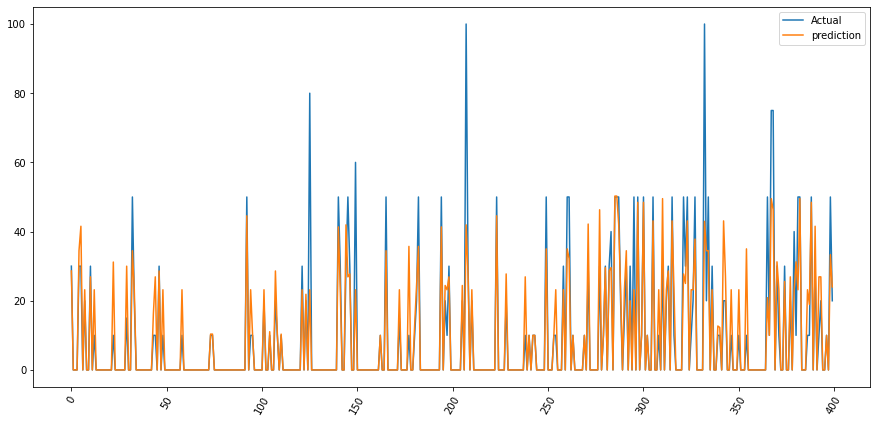

In [24]:
fig, ax = plt.subplots()
ax.plot(y[0:400],label = 'Actual')
ax.plot(DTR_y_pred[0:400],label = 'prediction')
plt.xticks(rotation = '60'); 
plt.legend()

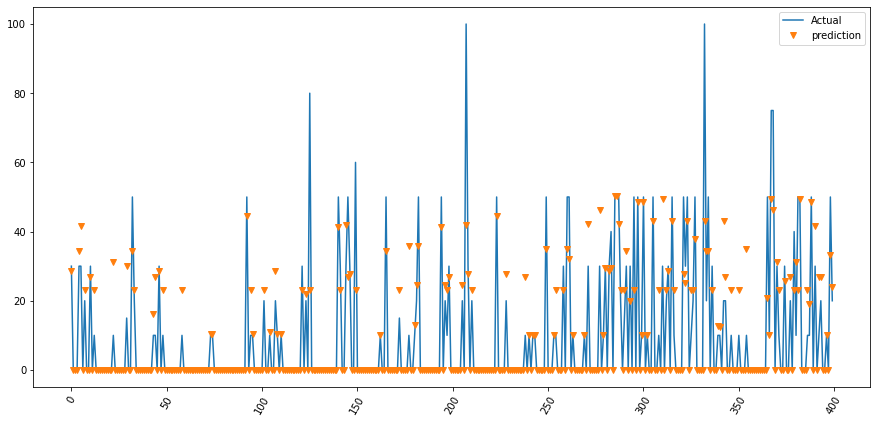

In [25]:
#plt.rcParams['figure.dpi'] = 150
plt.rcParams['figure.figsize'] = (15,7)
plt.plot(y[0:400],label = 'Actual')
plt.plot(DTR_y_pred[0:400],'v',label = 'prediction')
plt.xticks(rotation = '60'); 
plt.legend()
plt.show()

In [26]:
import graphviz
from sklearn.tree import export_graphviz
from io import StringIO  
from IPython.display import Image  
import pydotplus

In [27]:
feature_name=list(X.columns)
class_name = (list(y_train.unique()))
feature_name

['Dept_Computer Science and Engineering',
 'Dept_Software Engineering',
 'Dept_Business Administration',
 'Dept_Electrical and Electronic Engineering',
 'Dept_Textile Engineering',
 'Dept_Civil Engineering',
 'Dept_English',
 'Dept_Pharmacy',
 'Dept_Nutrition and Food Engineering',
 'Dept_Law',
 'Campus_Dhanmondi',
 'Campus_Permanent',
 'WaiverCategory_No Waiver',
 'WaiverCategory_Semester Result',
 'WaiverCategory_Permanent Campus Admission',
 'WaiverCategory_SSC & HSC Result',
 'WaiverCategory_Female Quota',
 'WaiverCategory_HSC Result',
 'WaiverCategory_Freedom Fighter Quota',
 'WaiverCategory_Financial Aid',
 'WaiverCategory_Siblings Category',
 'WaiverCategory_Diu Scholarship Category',
 'BAE_father',
 'BAE_mother',
 'BAE_brother',
 'BAE_parents',
 'BAE_uncle',
 'BAE_sister',
 'BAE_myself',
 'BAE_husband',
 'BAE_grandfather',
 'BAE_father and uncle',
 'OccBAE_Banker',
 'OccBAE_Doctor',
 'OccBAE_Doing Business',
 'OccBAE_Doing Government Service',
 'OccBAE_Doing Job Abroad',
 'OccB

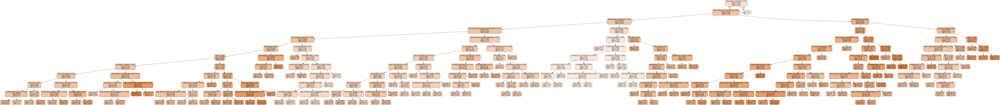

In [110]:
# create a dot_file which stores the tree structure
dot_data = export_graphviz(DTR,feature_names = feature_name,class_names=class_name,rounded = True,filled = True)
# Draw graph
graph = pydotplus.graph_from_dot_data(dot_data)  
graph.write_png("myTree.png")
# Show graph
Image(graph.create_png())

In [65]:
text_representation = tree.export_text(DTR)
print(text_representation)

|--- feature_12 <= 0.72
|   |--- feature_15 <= 0.91
|   |   |--- feature_16 <= 0.86
|   |   |   |--- feature_14 <= 0.72
|   |   |   |   |--- feature_19 <= 0.53
|   |   |   |   |   |--- feature_25 <= 0.65
|   |   |   |   |   |   |--- feature_54 <= 3.49
|   |   |   |   |   |   |   |--- feature_46 <= 0.22
|   |   |   |   |   |   |   |   |--- feature_11 <= 0.26
|   |   |   |   |   |   |   |   |   |--- feature_22 <= 0.19
|   |   |   |   |   |   |   |   |   |   |--- feature_37 <= 0.82
|   |   |   |   |   |   |   |   |   |   |   |--- value: [28.61]
|   |   |   |   |   |   |   |   |   |   |--- feature_37 >  0.82
|   |   |   |   |   |   |   |   |   |   |   |--- value: [20.00]
|   |   |   |   |   |   |   |   |   |--- feature_22 >  0.19
|   |   |   |   |   |   |   |   |   |   |--- feature_53 <= 3.93
|   |   |   |   |   |   |   |   |   |   |   |--- value: [23.18]
|   |   |   |   |   |   |   |   |   |   |--- feature_53 >  3.93
|   |   |   |   |   |   |   |   |   |   |   |--- value: [33.33]
|   |   

Executing shutdown due to inactivity...


2021-05-03 12:17:22,821 - INFO     - Executing shutdown due to inactivity...


Executing shutdown...


2021-05-03 12:17:26,969 - INFO     - Executing shutdown...


# Random Forest Regressor

In [28]:
from sklearn.ensemble import RandomForestRegressor
# from our observations randomforest is best fit
RF_clf = RandomForestRegressor(n_estimators=18,max_depth=14,random_state=0,min_samples_split=12,
    min_samples_leaf=11, n_jobs= -1)

In [29]:
RF_clf=RF_clf.fit(X_train, y_train)

In [30]:
RF_y_pred = RF_clf.predict(X_test)
#RF_y_pred

In [31]:
RF_trainScore=RF_clf.score(X_train,y_train)
RF_trainScore

0.7641945055387684

In [32]:
r2_score(y_test, RF_y_pred)

0.7782007467301619

In [33]:
print("Actual value:  Predicted value:")
print(list(y_test[0:30]))
print(RF_y_pred[0:30])

Actual value:  Predicted value:
[0, 0, 0, 0, 30, 0, 0, 20, 0, 20, 0, 20, 25, 15, 20, 0, 30, 10, 0, 20, 0, 10, 0, 0, 0, 0, 10, 0, 0, 0]
[ 0.          0.          0.          0.         32.0693802   0.
  0.         23.72625538  0.         28.01014155  0.         23.34422371
 24.46882505 18.63737859 21.943459    0.         32.18337077 22.82101913
  0.         23.01803595  0.         10.43416306  0.          0.
  0.          0.         17.32125999  0.          0.          0.        ]


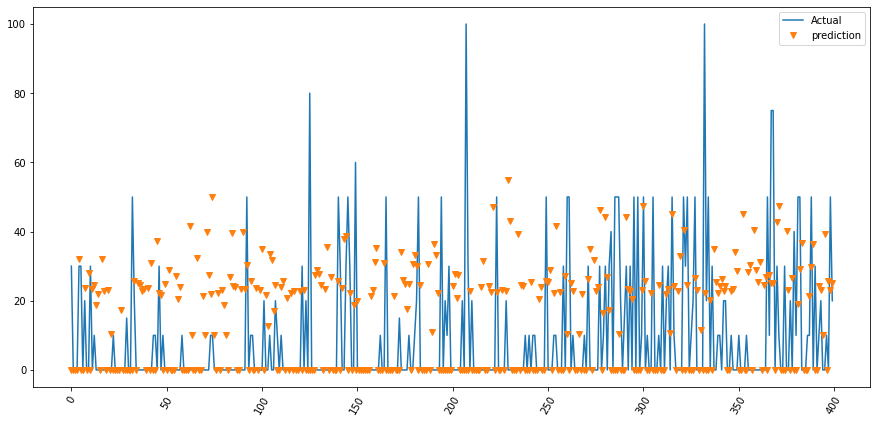

In [34]:
#plt.rcParams['figure.dpi'] = 150

plt.rcParams['figure.figsize'] = (15,7)
plt.plot(y[0:400],label = 'Actual')
plt.plot(RF_y_pred[0:400],'v',label = 'prediction')
plt.xticks(rotation = '60'); 
plt.legend()
plt.show()

# Cross validation for RF_regression

In [35]:
RFR = RandomForestRegressor(n_estimators=18,max_depth=14,random_state=0,min_samples_split=12,
    min_samples_leaf=11, n_jobs= -1)

In [36]:
RFR.fit(X,y)

RandomForestRegressor(max_depth=14, min_samples_leaf=11, min_samples_split=12,
                      n_estimators=18, n_jobs=-1, random_state=0)

In [37]:
cross_val_score(RFR,X,y,cv=11,)

array([0.69858279, 0.70548052, 0.65396679, 0.7261528 , 0.79612062,
       0.69095063, 0.69609722, 0.70798315, 0.63670601, 0.75353595,
       0.70620904])

In [38]:
RFR_trainScore=RFR.score(X_train,y_train)
RFR_trainScore

0.7642748155011936

In [39]:
RFR_y_pred=RFR.predict(X)

In [40]:
r2_score(y, RFR_y_pred)

0.7690302959803917

In [41]:
print("Actual value:  Predicted value:")
print(y[0:30])
print(RFR_y_pred[0:30])

Actual value:  Predicted value:
0     30
1      0
2      0
3      0
4     30
5     30
6      0
7     20
8      0
9      0
10    30
11     0
12    10
13     0
14     0
15     0
16     0
17     0
18     0
19     0
20     0
21     0
22    10
23     0
24     0
25     0
26     0
27     0
28     0
29    15
Name: WaiverPercentage, dtype: int64
[23.53521212  0.          0.          0.         34.53667388 32.49236117
  0.         26.81200208  0.          0.         29.9103898   0.
 27.18509848  0.          0.          0.          0.          0.
  0.          0.          0.          0.         28.12863764  0.
  0.          0.          0.          0.          0.         38.05582191]


In [42]:
from sklearn.metrics import mean_absolute_error,mean_squared_error

DT_MAE=mean_absolute_error(y, RFR_y_pred)
print("Mean Absolute Error:", DT_MAE)

DT_MSE=mean_squared_error(y, RFR_y_pred)
print("Mean Square Error:", DT_MSE)

#the root mean squared error
DT_rmse = mean_squared_error(y, RFR_y_pred, squared = False)
print("Root Mean Square Error:", DT_rmse)

Mean Absolute Error: 3.901964241344074
Mean Square Error: 71.63215384575558
Root Mean Square Error: 8.463578075835041


In [62]:
# from sklearn.metrics import multilabel_confusion_matrix
# multilabel_confusion_matrix(y, RFR_y_pred)

ValueError: x and y must be the same size

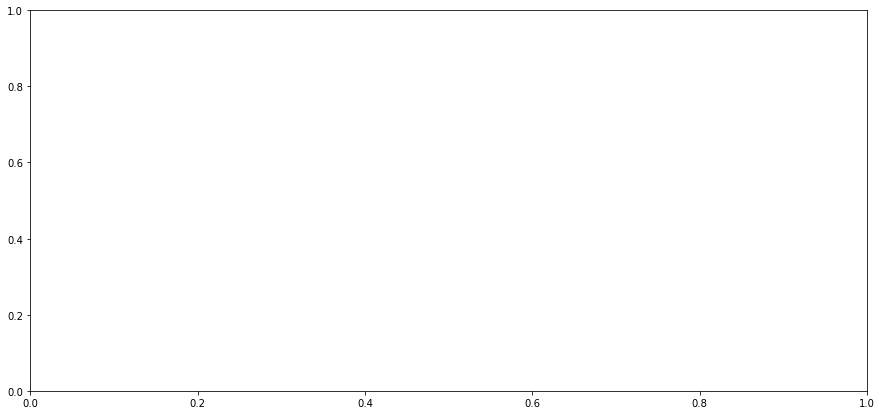

In [63]:
#visualize results
plt.scatter(X,y)
plt.plot(X,RFR_y_pred)
plt.show()

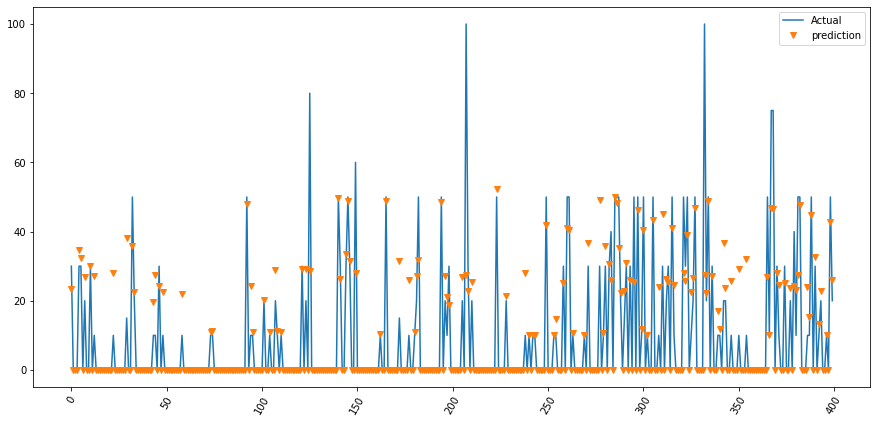

In [43]:
#plt.rcParams['figure.dpi'] = 150
plt.rcParams['figure.figsize'] = (15,7)
plt.plot(y[0:400],label = 'Actual')
plt.plot(RFR_y_pred[0:400],'v',label = 'prediction')
plt.xticks(rotation = '60'); 
plt.legend()
plt.show()

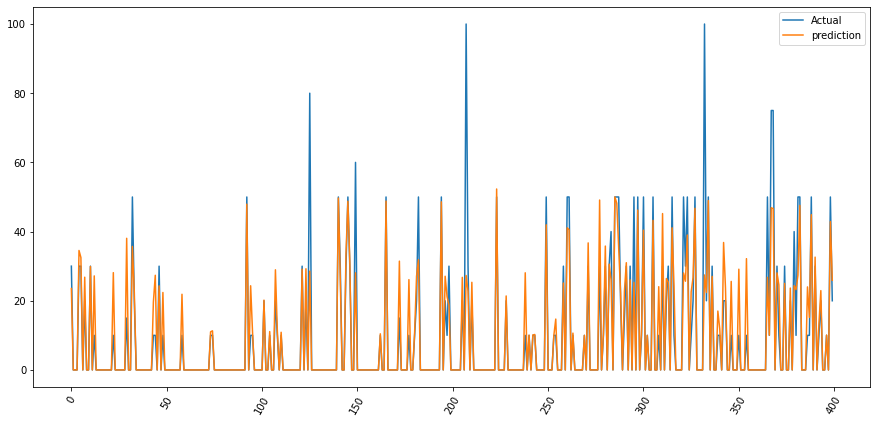

In [44]:
fig, ax = plt.subplots()
ax.plot(y[0:400],label = 'Actual')
ax.plot(RFR_y_pred[0:400],label = 'prediction')
plt.xticks(rotation = '60'); 
plt.legend()

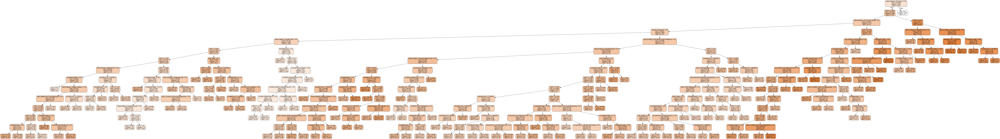

In [66]:
# Import tools needed for visualization
from sklearn.tree import export_graphviz
#import pydot
from io import StringIO  
from IPython.display import Image  
import pydotplus

# Pull out one tree from the forest
tree1 = RFR.estimators_[5]
dot_data = StringIO()


dot_data = export_graphviz(tree1,feature_names = feature_name,class_names=class_name,rounded = True,filled = True)
# Draw graph
graph = pydotplus.graph_from_dot_data(dot_data)  
graph.write_png("RFR_Tree.png")
# Show graph
Image(graph.create_png())

In [45]:
from sklearn.tree import export_text

print(export_text(RFR.estimators_[5], 
                  spacing=3, decimals=3,
                  feature_names=wine.feature_names))

NameError: name 'wine' is not defined

In [70]:
pip install wine

Note: you may need to restart the kernel to use updated packages.


ERROR: Could not find a version that satisfies the requirement wine (from versions: none)
ERROR: No matching distribution found for wine
